In [1]:
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from functools import lru_cache
import os
from scipy.spatial.distance import pdist, squareform
import networkx as ntx

In [2]:
pris = np.loadtxt(os.path.expanduser('~/Downloads/transmissions/size_10/size_10_pris.csv'), delimiter=',')
plt.plot(pris)

FileNotFoundError: /home/shardul/Downloads/transmissions/size_10/size_10_pris.csv not found.

In [3]:
size = 10
@lru_cache(maxsize=1024)
def configs(conc):
    df = {}
    for x in range(5000):
        path = os.path.expanduser(f'~/Downloads/transmissions/size_10/lead_size_10_conc_{conc}_config_{x}.csv')
        new_data = np.loadtxt(path, delimiter=',',skiprows=1)[:,1]
        df[x] = new_data
    df = pd.DataFrame(df)
#    df.index = np.arange(0, 4, 0.01)
    return df.clip(upper=size)


DEVICE_COMBS = {}

@lru_cache(maxsize=1024)
def chosen_for_config(n, size, config):
    width = int(size); n = int(n); cfg = int(config)
    if width not in DEVICE_COMBS:
        DEVICE_COMBS[width] = np.array([(i, j) for i in range(100) for j in range(width)], dtype=int)
    device_combs = DEVICE_COMBS[width]
    rng = np.random.RandomState(cfg)
    chosen_indices = rng.choice(len(device_combs), size=n, replace=False)
    return device_combs[chosen_indices]


def possible_combs(n, width):
    def combs_for_seed(x):
        return chosen_for_config(n, width, x)
    return combs_for_seed

@lru_cache(maxsize=1024)
def distance_matrix(conc,config):
    imps  = possible_combs(conc, size)
    item = imps(config)
    #print(np.diag(item[:,1]))
    x = np.stack((size - item[:,1],item[:,1]), axis=1)
    return squareform(pdist(item, metric='euclidean')) + np.diag(x.min(axis=1))

In [4]:
print("Creating manifest file...")

# This will store the info for each s#ample
manifest_data = []
# Define the root directory where files are stored
root_dir = os.path.expanduser('~/Downloads/transmissions/size_10/')

# Use the same loops as your original script
for conc in np.arange(7, 37, 2):
    for config in range(5000):
        # We just construct the path, we don't load the file here
        path = f'lead_size_10_conc_{conc}_config_{config}.csv'
        full_path = os.path.join(root_dir, path)

        # Check if the file actually exists before adding it to the manifest
        if os.path.exists(full_path):
            manifest_data.append({
                "concentration": conc,
                "config_id": config,
                "filepath": path  # Store the relative path
            })

# Convert the list of data into a pandas DataFrame
manifest_df = pd.DataFrame(manifest_data)

# Save the manifest to a CSV file
manifest_df.to_csv("manifest.csv", index_label="id")

print(f"Done! Created manifest.csv with {len(manifest_df)} entries.")

Creating manifest file...
Done! Created manifest.csv with 75000 entries.


In [5]:
manifest_df

,concentration,config_id,filepath
0,7,0,lead_size_10_conc_7_config_0.csv
1,7,1,lead_size_10_conc_7_config_1.csv
2,7,2,lead_size_10_conc_7_config_2.csv
3,7,3,lead_size_10_conc_7_config_3.csv
4,7,4,lead_size_10_conc_7_config_4.csv
...,...,...,...
74995,35,4995,lead_size_10_conc_35_config_4995.csv
74996,35,4996,lead_size_10_conc_35_config_4996.csv
74997,35,4997,lead_size_10_conc_35_config_4997.csv
74998,35,4998,lead_size_10_conc_35_config_4998.csv


In [6]:
class transmissions_dataset(Dataset):
    def __init__(self,manifest_file, root_dir,matrix_size=50,pris_file='~/Downloads/transmissions/size_10/size_10_pris.csv'):
        print("Initializing dataset...")
        self.manifest = pd.read_csv(manifest_file,index_col="id")
        self.root_dir = root_dir
        self.matrix_size = matrix_size
        self.pris = np.loadtxt(os.path.expanduser(pris_file), delimiter=',')
        print("dataset_ready")

    def __len__(self):
        print("Getting length of dataset...")
        print(f"Length: {len(self.manifest)}")
        return len(self.manifest)
    def __getitem__(self, idx):
        sample_info = self.manifest.iloc[idx]
        conc = sample_info['concentration']
        config = sample_info['config_id']
        filepath = os.path.join(self.root_dir, sample_info['filepath'])
        print(f"Loading data from {filepath}...")
        print(f"Concentration: {conc}, Config ID: {config}")


        #"Get distance matrix"
        dist_mat = 0 *np.eye(self.matrix_size)
        dist_mat[:conc,:conc] +=  distance_matrix(conc, config)
        y = torch.tensor(conc, dtype = torch.float32)
        

        #"Get transmission data"
        new_data = np.loadtxt(filepath, delimiter=',',skiprows=1)[:,1]
        x = torch.tensor(np.clip(new_data, 0, self.pris), dtype=torch.float32)


        return x, y

In [7]:
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader, random_split
import torch.optim as optim

In [8]:
dataset = transmissions_dataset(manifest_file='manifest.csv', root_dir=os.path.expanduser('~/Downloads/transmissions/size_10/'))

Initializing dataset...
dataset_ready


In [9]:
from sklearn.preprocessing import StandardScaler

In [24]:
transmissions = []
concs = []
for i in range(len(dataset)):
    a,b = dataset[i]
    cond = (a.numpy()-a.numpy().mean()) / (a.numpy().std()+ 1e-8)
    cond_1 = torch.tensor(cond, dtype=float)
    transmissions.append(cond_1)
    b_1 = torch.tensor(b,dtype=float)
    concs.append(b)

Getting length of dataset...
Length: 75000
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_0.csv...
Concentration: 7, Config ID: 0
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_1.csv...
Concentration: 7, Config ID: 1
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_2.csv...
Concentration: 7, Config ID: 2
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_3.csv...
Concentration: 7, Config ID: 3
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_4.csv...
Concentration: 7, Config ID: 4
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_5.csv...
Concentration: 7, Config ID: 5
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_6.csv...
Concentration: 7, Config ID: 6
Loading data from /home/shardul/Download

/tmp/ipykernel_485287/3641743656.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  b_1 = torch.tensor(b,dtype=float)


Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_284.csv...
Concentration: 7, Config ID: 284
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_285.csv...
Concentration: 7, Config ID: 285
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_286.csv...
Concentration: 7, Config ID: 286
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_287.csv...
Concentration: 7, Config ID: 287
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_288.csv...
Concentration: 7, Config ID: 288
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_289.csv...
Concentration: 7, Config ID: 289
Loading data from /home/shardul/Downloads/transmissions/size_10/lead_size_10_conc_7_config_290.csv...
Concentration: 7, Config ID: 290
Loading data from /home/shardul/Downloads/transmissions

In [26]:
concs[0]

tensor(7.)

In [28]:
torch.save((transmissions, concs), "dataset_concentration.pt")

In [29]:
transmission, concentrations = torch.load("dataset_concentration.pt") 

In [32]:
type(transmission)

list

In [ ]:
print(type(transmission), transmission.shape)
print(type(concentrations), concentrations.shape)


In [33]:
dataset_new = TensorDataset(torch.stack(transmission),torch.stack(concentrations))

In [36]:
x_1, y_1 = dataset_new[0] 
y_1

tensor(7.)

In [37]:
class inversion_nn(nn.Module):
    def __init__(self, num_points = 400, hidden_dim=128):
        super(inversion_nn,self).__init__()
        self.input_dim = num_points
        self.output_dim = 1

        self.net = nn.Sequential(
            nn.Linear(self.input_dim,hidden_dim),
        #    nn.BatchNorm1d(hidden_dim),
            nn.Dropout(p=0.3),
            nn.ReLU(),
            nn.Linear(hidden_dim,hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.Dropout(p=0.3),
            nn.ELU(),
            nn.Linear(hidden_dim,32),
        #1    nn.BatchNorm1d(32),
            nn.Dropout(p=0.3),
            nn.ReLU(),
            nn.Linear(32,1),
            
        )

    def forward(self,x):
        x = x.view(x.size(0),-1)
        out = self.net(x)
        return out

In [38]:
def training_loop(num_epochs, val_split,batch_size = 32):
    device = "cpu"

    model = inversion_nn(num_points=400,hidden_dim=128)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-5, weight_decay=1e-4)


    n_val = int(len(dataset_new) * val_split)

    n_train = int(len(dataset_new)) - n_val

    train_df, val_ds = random_split(dataset_new, [n_train, n_val])

    train_loader = DataLoader(train_df,
                              shuffle=True,
                              batch_size=32,
                              num_workers=8, 
                              prefetch_factor=2,  # each worker preloads batches ahead of time
                              persistent_workers=True)


    val_loader = DataLoader(val_ds,
                              shuffle=False,
                              batch_size=32,
                              num_workers=8, 
                              prefetch_factor=2,  # each worker preloads batches ahead of time
                              persistent_workers=True)

    model = model.to(device)

    train_loss = []
    val_loss = []

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for step, (xb,yb) in enumerate(train_loader):
            xb,yb = xb.to(device).float(), yb.to(device).float()
            preds = model(xb).squeeze(-1)

            loss = F.mse_loss(preds,yb)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss = total_loss + loss.item()


        avg_loss = total_loss/len(train_loader)

        train_loss.append(avg_loss)


        print(f"Epoch {epoch+1:03d} | Loss: {avg_loss:.6f}")




        model.eval()
        val_loss_1 = 0

        with torch.no_grad():
            for xb,yb in val_loader:
                xb,yb = xb.to(device).float(), yb.to(device).float()
    
                preds = model(xb).squeeze(-1)

                loss = F.mse_loss(preds,yb)

                val_loss_1 = val_loss_1 + loss.item()

        avg_val_loss = val_loss_1/len(val_loader)

        val_loss.append(avg_val_loss)

        print(f"Epoch {epoch+1:03d} | Train Loss: {avg_loss:.6f} | Val Loss: {avg_val_loss:.6f}")

    plt.figure(figsize=(8,5))
    plt.plot(train_loss, label="Train Loss")
    plt.plot(val_loss, label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.title("Training & Validation Loss Curve")
    plt.legend()
    plt.grid(True)
    plt.show()




    return model, (train_loss, val_loss)



Epoch 001 | Loss: 505.202457
Epoch 001 | Train Loss: 505.202457 | Val Loss: 507.213193
Epoch 002 | Loss: 459.323124
Epoch 002 | Train Loss: 459.323124 | Val Loss: 487.869053
Epoch 003 | Loss: 383.653846
Epoch 003 | Train Loss: 383.653846 | Val Loss: 460.087255
Epoch 004 | Loss: 294.248164
Epoch 004 | Train Loss: 294.248164 | Val Loss: 415.822423
Epoch 005 | Loss: 208.814845
Epoch 005 | Train Loss: 208.814845 | Val Loss: 367.290867
Epoch 006 | Loss: 144.676415
Epoch 006 | Train Loss: 144.676415 | Val Loss: 346.186185
Epoch 007 | Loss: 107.900097
Epoch 007 | Train Loss: 107.900097 | Val Loss: 293.190018
Epoch 008 | Loss: 90.898186
Epoch 008 | Train Loss: 90.898186 | Val Loss: 290.083537
Epoch 009 | Loss: 85.591514
Epoch 009 | Train Loss: 85.591514 | Val Loss: 260.215805
Epoch 010 | Loss: 82.238328
Epoch 010 | Train Loss: 82.238328 | Val Loss: 244.964532
Epoch 011 | Loss: 81.907284
Epoch 011 | Train Loss: 81.907284 | Val Loss: 279.617953
Epoch 012 | Loss: 78.763843
Epoch 012 | Train Loss:

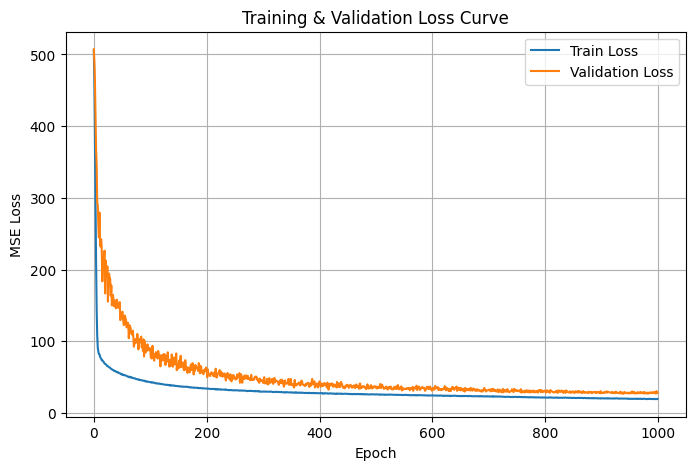

In [39]:
trained_model = training_loop(1000,0.2)

In [ ]:
new_path = os.path.expanduser(f'~/Downloads/transmissions/size_10/lead_size_10_conc_{43}_config_{1}.csv')
new_input = np.loadtxt(new_path, delimiter=',',skiprows=1)[:,1]

In [ ]:
def predict_new(model, new_data):
    """
    model    : trained PyTorch model (from training_loop)
    new_data : numpy array (N x 400) or torch.Tensor
    """
    model.eval()

    if isinstance(new_data, np.ndarray):
        x_new = torch.tensor(new_data, dtype=torch.float32)
    else:
        x_new = new_data.float()

    if x_new.ndim == 1:   # shape (400,)
       x_new = x_new.unsqueeze(0)   # -> (1, 400)
    elif x_new.shape[1] == 1 and x_new.shape[0] == 400:
        x_new = x_new.view(1, -1)    # -> (1, 400)

    # If you want to normalize per batch (like in training):
    mean = x_new.mean(dim=0, keepdim=True)
    std = x_new.std(dim=0, keepdim=True) + 1e-8
    x_new = (x_new - mean) / std

    with torch.no_grad():
        preds = model(x_new).squeeze(-1)

    return preds.cpu().numpy()  # return as numpy for convenience


In [ ]:
test_1,(a1,b1) = trained_model

In [ ]:
preds = predict_new(test_1, new_input)

print("Predicted concentrations:", preds)

In [ ]:
mean = new_input.mean(dim=0, keepdim=True)
std = new_input.std(dim=0, keepdim=True) + 1e-8
xb = (new_input - mean) / std

xb

In [ ]:
with torch.no_grad():
    preds = test_1(xb)
    preds_numpy = preds.numpy()
    print(preds_numpy)